In [ ]:
import pandas as pd
import numpy as np

In [ ]:
ds = pd.read_csv('/datasets/Cement.csv')
ds.head()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


cement : Cement (Component 1, kg in m^3 mixture)

slag : Bias Furnace Slag (Component 2, kg in m^3 mixture)

flyash : Fly Ash (Component 3, kg in m^3 mixture)

water : Water (Component 4, kg in m^3 mixture)

superplasticizer : Superplasticizer (Component 5, kg in m^3 mixture)

coarseaggregate : Coarse Aggregate (Component 6, kg in m^3 mixture)

fineaggregate : Fine Aggregate (Component 7, kg in m^3 mixture)

age : Age (day)

csMPa : Concrete compressive strength (MPa, megapascals)

In [ ]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cement            1030 non-null   float64
 1   slag              1030 non-null   float64
 2   flyash            1030 non-null   float64
 3   water             1030 non-null   float64
 4   superplasticizer  1030 non-null   float64
 5   coarseaggregate   1030 non-null   float64
 6   fineaggregate     1030 non-null   float64
 7   age               1030 non-null   int64  
 8   csMPa             1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [ ]:
ds.corr()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa
cement,1.000000,-0.275216,-0.397467,-0.081587,0.092386,-0.109349,-0.222718,0.081946,0.497832
slag,-0.275216,1.000000,-0.323580,0.107252,0.043270,-0.283999,-0.281603,-0.044246,0.134829
flyash,-0.397467,-0.323580,1.000000,-0.256984,0.377503,-0.009961,0.079108,-0.154371,-0.105755
water,-0.081587,0.107252,-0.256984,1.000000,-0.657533,-0.182294,-0.450661,0.277618,-0.289633
superplasticizer,0.092386,0.043270,0.377503,-0.657533,1.000000,-0.265999,0.222691,-0.192700,0.366079
coarseaggregate,-0.109349,-0.283999,-0.009961,-0.182294,-0.265999,1.000000,-0.178481,-0.003016,-0.164935
fineaggregate,-0.222718,-0.281603,0.079108,-0.450661,0.222691,-0.178481,1.000000,-0.156095,-0.167241
age,0.081946,-0.044246,-0.154371,0.277618,-0.192700,-0.003016,-0.156095,1.000000,0.328873
csMPa,0.497832,0.134829,-0.105755,-0.289633,0.366079,-0.164935,-0.167241,0.328873,1.000000


In [ ]:
ds.isna().sum()

,0
cement,0
slag,0
flyash,0
water,0
superplasticizer,0
coarseaggregate,0
fineaggregate,0
age,0
csMPa,0


In [ ]:
pip install ydata_profiling

In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df=ds, title='Cement Profile Report')
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:528: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
x = ds.iloc[:, :-1]
y = ds['csMPa']
x.head()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360


In [ ]:
y.head()

,csMPa
0,79.99
1,61.89
2,40.27
3,41.05
4,44.30


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=58, test_size=0.2)
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(824, 8) (824,)
(206, 8) (206,)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

<ipython-input-49-0a9daec96f75>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x_train)
<ipython-input-49-0a9daec96f75>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x_test)


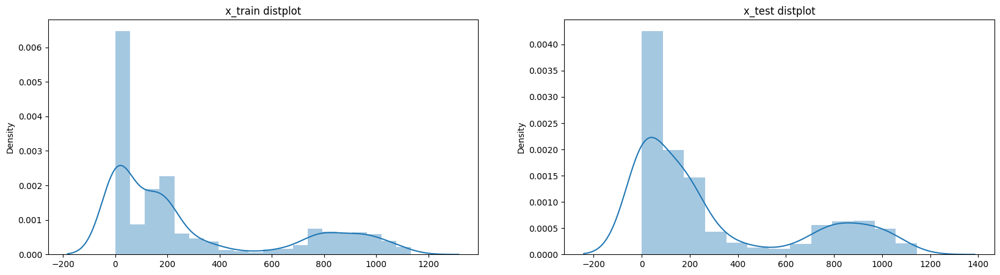

In [ ]:
plt.figure(figsize=(20, 5))
plt.subplot(1,2,1)
sns.distplot(x_train)
plt.title('x_train distplot')
plt.subplot(1,2,2)
sns.distplot(x_test)
plt.title('x_test distplot')
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn import metrics

In [ ]:
lr_model = LinearRegression()
lasso_model = Lasso()
ridge_model = Ridge()
rfr_model = RandomForestRegressor()
gbr_model = GradientBoostingRegressor()

In [ ]:
lr_model.fit(x_train, y_train)
lasso_model.fit(x_train, y_train)
ridge_model.fit(x_train, y_train)
rfr_model.fit(x_train, y_train)
gbr_model.fit(x_train, y_train)

GradientBoostingRegressor()

# Linear Regression

In [ ]:
print(f'Linear Regression Training Score {lr_model.score(x_train, y_train)}')

Linear Regression Training Score 0.6286589891320405


In [ ]:
y_lr_predict = lr_model.predict(x_test)
print(f'Linear Regression Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_lr_predict)}')
print(f'Linear Regression Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_lr_predict)}')
print(f'Linear Regression Testing R2 Score {metrics.r2_score(y_test, y_lr_predict)}')

Linear Regression Testing Mean Absolute Error 8.912175511299775
Linear Regression Testing Mean Squared Error 125.27015773887206
Linear Regression Testing R2 Score 0.5597016025079383


# Lasso

In [ ]:
print(f'Lasso Training Score {lasso_model.score(x_train, y_train)}')

Lasso Training Score 0.20813904376317816


In [ ]:
y_lasso_predict = lasso_model.predict(x_test)
print(f'Lasso Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_lasso_predict)}')
print(f'Lasso Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_lasso_predict)}')
print(f'Lasso Testing R2 Score {metrics.r2_score(y_test, y_lasso_predict)}')

Lasso Testing Mean Absolute Error 12.018336817955502
Lasso Testing Mean Squared Error 226.6492737481369
Lasso Testing R2 Score 0.20337521860501473


# Ridge

In [ ]:
print(f'Ridge Training Score {ridge_model.score(x_train, y_train)}')

Ridge Training Score 0.625984122487047


In [ ]:
y_ridge_predict = ridge_model.predict(x_test)
print(f'Ridge Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_ridge_predict)}')
print(f'Ridge Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_ridge_predict)}')
print(f'Ridge Testing R2 Score {metrics.r2_score(y_test, y_ridge_predict)}')

Ridge Testing Mean Absolute Error 8.99156584629163
Ridge Testing Mean Squared Error 125.79839911576063
Ridge Testing R2 Score 0.5578449445781394


# Random Forrest Regression

In [ ]:
print(f'Random Forrest Regression Regression Training Score {rfr_model.score(x_train, y_train)}')

Random Forrest Regression Regression Training Score 0.9837015011153263


In [ ]:
y_rfr_predict = rfr_model.predict(x_test)
print(f'Random Forrest Regression Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_rfr_predict)}')
print(f'Random Forrest Regression Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_rfr_predict)}')
print(f'Random Forrest Regression Testing R2 Score {metrics.r2_score(y_test, y_rfr_predict)}')
print(f'Random Forrest Regression Training R2 Score {metrics.r2_score(y_train, rfr_model.predict(x_train))}')

Random Forrest Regression Testing Mean Absolute Error 3.4642952993527483
Random Forrest Regression Testing Mean Squared Error 26.253892032616754
Random Forrest Regression Testing R2 Score 0.9077230619124241
Random Forrest Regression Training R2 Score 0.9837015011153263


# Gradient Boosting Regression

In [ ]:
print(f'Gradient Boosting Regression Training Score {gbr_model.score(x_train, y_train)}')

Gradient Boosting Regression Training Score 0.9492931334496998


In [ ]:
y_gbr_predict = gbr_model.predict(x_test)
print(f'Gradient Boosting Regression Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_gbr_predict)}')
print(f'Gradient Boosting Regression Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_gbr_predict)}')
print(f'Gradient Boosting Regression Testing R2 Score {metrics.r2_score(y_test, y_gbr_predict)}')
print(f'Gradient Boosting Regression Training R2 Score {metrics.r2_score(y_train, gbr_model.predict(x_train))}')

Gradient Boosting Regression Testing Mean Absolute Error 3.5301445699859566
Gradient Boosting Regression Testing Mean Squared Error 24.502584470006294
Gradient Boosting Regression Testing R2 Score 0.9138785416152635
Gradient Boosting Regression Testing R2 Score 0.9492931334496998


# Hyperparameter Tunning

## RandomForestRegressor

In [ ]:
# for hyperparameter tunning uses 2 models -> RendomForestRegressor, GradientBoostingRegressor
!pip install optuna

We will try adjusting the following set of hyperparameters:

n_estimators = number of trees in the foreset

max_features = max number of features considered for splitting a node

max_depth = max number of levels in each decision tree

min_samples_split = min number of data points placed in a node before the node
is split

min_samples_leaf = min number of data points allowed in a leaf node

bootstrap = method for sampling data points (with or without replacement)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, make_scorer
import optuna

In [ ]:
# Define the objective function
def rfr_fun(trial):
  # Suggest values for the hyperparameters
  n_estimators = trial.suggest_int('n_estimators', 50, 300)
  max_depth = trial.suggest_int('max_depth', 3, 100)
  min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
  bootstrap = trial.suggest_categorical('bootstrap', [True, False])
  # Create the model with the suggested hyperparameters

  model = RandomForestRegressor(
      n_estimators=n_estimators,
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      bootstrap=bootstrap,
  )

  # Perform cross-validation and return the mean r2 score
  score = cross_val_score(model, x_train, y_train, cv=3, scoring=make_scorer(r2_score)).mean()
  return score


In [ ]:
# create a study and optimize it using TreeParsenEstimator sempler
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler()) # we maximize r2 score
study.optimize(rfr_fun, n_trials=100) # Run 50 trials to find the best hyperparameters

[I 2024-12-28 16:32:54,461] A new study created in memory with name: no-name-c3c1b4c3-104f-4391-80cb-9c91d6b0333c
[I 2024-12-28 16:32:56,882] Trial 0 finished with value: 0.8814044325660157 and parameters: {'n_estimators': 250, 'max_depth': 14, 'min_samples_split': 7, 'min_samples_leaf': 3, 'bootstrap': True}. Best is trial 0 with value: 0.8814044325660157.
[I 2024-12-28 16:32:59,891] Trial 1 finished with value: 0.824630979806428 and parameters: {'n_estimators': 244, 'max_depth': 77, 'min_samples_split': 5, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 0.8814044325660157.
[I 2024-12-28 16:33:04,659] Trial 2 finished with value: 0.8243055376548364 and parameters: {'n_estimators': 290, 'max_depth': 99, 'min_samples_split': 4, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 0.8814044325660157.
[I 2024-12-28 16:33:07,237] Trial 3 finished with value: 0.8190297880604845 and parameters: {'n_estimators': 243, 'max_depth': 72, 'min_samples_spl

In [ ]:
# print best parameters
print("Best R2 Score :", study.best_trial.value)
print("Best Hyperparameter :", study.best_trial.params)

Best R2 Score : 0.898853377709282
Best Hyperparameter : {'n_estimators': 243, 'max_depth': 35, 'min_samples_split': 2, 'min_samples_leaf': 1, 'bootstrap': True}


In [125]:
from sklearn import metrics

best_rfr_model = RandomForestRegressor(
    n_estimators=study.best_trial.params['n_estimators'],
    max_depth=study.best_trial.params['max_depth'],
    min_samples_split=study.best_trial.params['min_samples_split'],
    min_samples_leaf=study.best_trial.params['min_samples_leaf'],
    bootstrap=study.best_trial.params['bootstrap'],
)

best_rfr_model.fit(x_train, y_train)
y_best_rfr_predict = best_rfr_model.predict(x_test)
print(f'Best Random Forrest Regression Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_best_rfr_predict)}')
print(f'Best Random Forrest Regression Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_best_rfr_predict)}')
print(f'Best Random Forrest Regression Testing R2 Score {metrics.r2_score(y_test, y_best_rfr_predict)}')

Best Random Forrest Regression Testing Mean Absolute Error 3.430390140770037
Best Random Forrest Regression Testing Mean Squared Error 25.643156541208477
Best Random Forrest Regression Testing R2 Score 0.9098696693966992


In [ ]:
from optuna.visualization import plot_optimization_history, plot_parallel_coordinate, plot_slice, plot_contour, plot_param_importances

In [ ]:
plot_optimization_history(study).show()

In [ ]:
plot_parallel_coordinate(study).show()

In [ ]:
plot_slice(study).show()

In [ ]:
plot_contour(study).show()

In [ ]:
plot_param_importances(study).show()

## GradientBoostingRegressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, make_scorer
import optuna

In [113]:
def gbr_fun(trial):
  n_estimators = trial.suggest_int('n_estimators', 50, 300)
  min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
  learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3, log=True)
  max_depth = trial.suggest_int('max_depth', 3, 100)

  model = GradientBoostingRegressor(
            n_estimators=n_estimators,
            learning_rate=learning_rate,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
        )

  # Perform cross-validation and return the mean accuracy
  score = cross_val_score(model, x_train, y_train, cv=3, scoring=make_scorer(r2_score)).mean()
  return score

In [114]:
study2 = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler())
study2.optimize(gbr_fun, n_trials=100)

[I 2024-12-28 17:25:21,056] A new study created in memory with name: no-name-eacbffa7-6bb7-4a35-99e0-a5af20ec88a8
[I 2024-12-28 17:25:27,360] Trial 0 finished with value: 0.8265594222187639 and parameters: {'n_estimators': 244, 'min_samples_split': 2, 'min_samples_leaf': 1, 'learning_rate': 0.22422551489037237, 'max_depth': 57}. Best is trial 0 with value: 0.8265594222187639.
[I 2024-12-28 17:25:29,652] Trial 1 finished with value: 0.8956002717626763 and parameters: {'n_estimators': 174, 'min_samples_split': 9, 'min_samples_leaf': 2, 'learning_rate': 0.03703319545226451, 'max_depth': 92}. Best is trial 1 with value: 0.8956002717626763.
[I 2024-12-28 17:25:31,639] Trial 2 finished with value: 0.8958281674753862 and parameters: {'n_estimators': 188, 'min_samples_split': 7, 'min_samples_leaf': 3, 'learning_rate': 0.022626930616174143, 'max_depth': 9}. Best is trial 2 with value: 0.8958281674753862.
[I 2024-12-28 17:25:34,402] Trial 3 finished with value: 0.8921876541537824 and parameters:

In [115]:
# print best parameters
print("Best R2 Score :", study2.best_trial.value)
print("Best Hyperparameter :", study2.best_trial.params)

Best R2 Score : 0.9103826855594765
Best Hyperparameter : {'n_estimators': 284, 'min_samples_split': 10, 'min_samples_leaf': 3, 'learning_rate': 0.03201860431180649, 'max_depth': 6}


In [118]:
from sklearn import metrics

best_gbr_model = GradientBoostingRegressor(
    n_estimators=study2.best_trial.params['n_estimators'],
    max_depth=study2.best_trial.params['max_depth'],
    min_samples_split=study2.best_trial.params['min_samples_split'],
    min_samples_leaf=study2.best_trial.params['min_samples_leaf'],
    learning_rate=study2.best_trial.params['learning_rate'],
)

best_gbr_model.fit(x_train, y_train)
y_best_gbr_predict = best_gbr_model.predict(x_test)
print(f'Best Gradient Boosting Regression Testing Mean Absolute Error {metrics.mean_absolute_error(y_test, y_best_gbr_predict)}')
print(f'Best Gradient Boosting Regression Testing Mean Squared Error {metrics.mean_squared_error(y_test, y_best_gbr_predict)}')
print(f'Best Gradient Boosting Regression Testing R2 Score {metrics.r2_score(y_test, y_best_gbr_predict)}')

Best Gradient Boosting Regression Testing Mean Absolute Error 3.0321699394266877
Best Gradient Boosting Regression Testing Mean Squared Error 21.423506403719305
Best Gradient Boosting Regression Testing R2 Score 0.9247008568642402


In [119]:
# For visualizations
from optuna.visualization import plot_optimization_history, plot_parallel_coordinate, plot_slice, plot_contour, plot_param_importances

In [120]:
# 1. Optimization History
plot_optimization_history(study2).show()

In [121]:
# 2. Parallel Coordinates Plot
plot_parallel_coordinate(study2).show()

In [122]:
# 3. Slice Plot
plot_slice(study2).show()

In [123]:
# 4. Contour Plot
plot_contour(study2).show()

In [124]:
# 5. Hyperparameter Importance
plot_param_importances(study2).show()

# Conclusion
Best Gradient Boosting Regression Testing Mean Absolute Error 3.0321699394266877

Best Gradient Boosting Regression Testing Mean Squared Error 21.423506403719305

Best Gradient Boosting Regression Testing R2 Score 0.9247008568642402

Best Gradient Boosting Regression Training R2 Score 0.9103826855594765

##---------------------------------------------------------------

Best Random Forrest Regression Testing Mean Absolute Error 3.430390140770037

Best Random Forrest Regression Testing Mean Squared Error 25.643156541208477

Best Random Forrest Regression Testing R2 Score 0.9098696693966992

Best Random Forrest Regression Training R2 Score 0.898853377709282